In [1]:
!pip install -q git+https://github.com/tensorflow/docs

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [6]:
environment = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', 'localhost')

In [380]:
# import libraries 
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
# %matplotlib inline
import math

from urllib.parse import urljoin
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, QuantileTransformer
from sklearn.compose import ColumnTransformer, make_column_transformer, make_column_selector, TransformedTargetRegressor
from sklearn.impute import SimpleImputer, KNNImputer

from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
# from sklearn.ensemble importGradientBoostingRegressor, VotingRegressor
# from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR, LinearSVR
from sklearn.model_selection import GridSearchCV, cross_validate, cross_val_score, cross_val_predict, train_test_split

import tensorflow as tf
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling
from tensorflow import keras
from tensorflow.keras import layers,regularizers
from keras.wrappers.scikit_learn import KerasRegressor

import pyreadr

# palabras a buscar en columna descripción
TEXT_MINING_KEYWORDS = ['balcon', 'cochera', 'sum', 'parrilla', 'pileta']

# BASE_URL_DATA = '/kaggle/input/prediccion-precio-propiedades-fmap-2020/'
BASE_URL_DATA = '/kaggle/input/prediccion-precio-propiedades-corregido/' if environment != 'localhost' else ''

def vectorize_descripcion(df: pd.DataFrame):
    
    # entrenamos el modelo para buscar las keywords
    vectorizer = CountVectorizer(binary=True, strip_accents='unicode')  
    vectorizer.fit(TEXT_MINING_KEYWORDS)

    # hot encoding de los resultados
    desc = vectorizer.transform(df['descripcion'])

    # crear dataframe con resultados
    df_desc = pd.DataFrame(data=desc.toarray(), columns=vectorizer.get_feature_names())
    return pd.concat([df.reset_index(drop=True), df_desc.reset_index(drop=True)], axis=1, sort=False)

def get_outliers(df: pd.DataFrame):
    return df[df_train['id'].isin(['7798', '31417', '10764', '12865', '22126', '49492'])]

def remove_outliers(df: pd.DataFrame):
    outliers = get_outliers(df)
    df.drop(outliers.index, inplace=True)

def preprocessing(df: pd.DataFrame, process_outliers = True):
    # nombres features en minuscula
    df.columns = map(str.lower, df.columns)

    df['barrio'] = df['barrio'].astype('category')
    df['cluster'] = df['cluster'].astype('category')
    df['id'] = df['id'].astype('int')
    
    # guardar los id
    ids = df['id']
    
    # eliminar outliers
    if process_outliers:
        remove_outliers(df)
    
    # text mining buscar keywords en descripcion
    df['descripcion'].fillna('', inplace=True)
    df = vectorize_descripcion(df)
    
    # eliminar columnas innecesarias del modelo
    df.drop([
        'banios',
        'barrio', 
        'subbarrio',
        'descripcion',
        'p_mt2', 
        'n_bancos',
        'n_barrios_p', 
        'n_bici', 
        'n_boliches', 
        'n_clinicas', 
        'n_comisarias',
        'n_embajadas', 
        'n_gasolina', 
        'n_gastronomica', 
        'n_homicidios',
        'n_hospitales', 
        'n_hurtos', 
        'n_hurtos_auto',
        'n_robo', 
        'n_robo_vehi',
        'n_subte_bocas', 
        'n_uni',
        # 'cluster',
        # 'terraza',
        'lujo',
        'sup_cubierta'
    ],axis=1, inplace=True, errors='ignore')


    return ids, df.set_index('id')


def split_data(df: pd.DataFrame, test_size = 0.05):
    y = df['precio']
    X = df.drop(['precio'], axis=1)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state=5)
    return X_train, X_test, y_train, y_test


## Preprocesamiento de los features: imputación, estandarización, one-hot encoding
def make_transformer_pipeline():
    numeric_transformer = make_pipeline( 
        SimpleImputer(missing_values = np.nan, strategy='mean'),
        StandardScaler(),
    )

    categorical_transformer = make_pipeline(
        #SimpleImputer(strategy='constant', fill_value='missing'),
        #SimpleImputer(strategy="most_frequent"),
        #KNNImputer(n_neighbors=3, weights="uniform"),     # KNNImputer tarda una eternidad...
        OneHotEncoder(handle_unknown='ignore')
    )

    return make_column_transformer(
        (numeric_transformer, make_column_selector(dtype_include=['int64', 'float64'])),
        (categorical_transformer, make_column_selector(dtype_include=['category']))
    )    

def baseline_ada_model_pipeline():
    transformer = make_transformer_pipeline()
    ada = AdaBoostRegressor(random_state = 5)
    
    return make_pipeline(transformer, TransformedTargetRegressor(ada, func=np.log, inverse_func=np.exp))    

def create_train_ada_model():
    transformer = make_transformer_pipeline()

    model = Pipeline([
        ('preprocessing', transformer),
        ('model', TransformedTargetRegressor(AdaBoostRegressor(base_estimator=DecisionTreeRegressor(), loss='square', random_state=5), func=np.log, inverse_func=np.exp))
    ])
    return model

def baseline_rfr_model_pipeline():
    transformer = make_transformer_pipeline()
    rfr = RandomForestRegressor(n_estimators=300, max_depth=25, max_features='sqrt', random_state = 5)
    
    return make_pipeline(transformer, TransformedTargetRegressor(rfr, func=np.log, inverse_func=np.exp))

def create_train_rfr_model():
    transformer = make_transformer_pipeline()

    model = Pipeline([
        ('preprocessing', transformer),
        ('model', TransformedTargetRegressor(RandomForestRegressor(random_state=5), func=np.log, inverse_func=np.exp))
    ])
    return model

def create_train_svr_model():
    transformer = make_transformer_pipeline()

    model = Pipeline([
        ('preprocessing', transformer),
        ('model', TransformedTargetRegressor(SVR(cache_size=500), func=np.log, inverse_func=np.exp))
    ])
    return model    

def create_train_linear_svr_model():
    transformer = make_transformer_pipeline()
    model = Pipeline([
        ('preprocessing', transformer),
        ('model', LinearSVR(loss='squared_epsilon_insensitive', random_state=5))
    ])
    return model    

# Crear modelo red neuronal Keras
def build_1layer_keras_model(input_dim, n_neurons = 8):    
    model = keras.Sequential()
    model.add(layers.Dense(n_neurons, activation='relu', input_dim=input_dim))
    model.add(layers.Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=[tf.keras.metrics.RootMeanSquaredError()])

    return model

# Crear modelo red neuronal Keras
def build_2layer_keras_model(input_dim, n_neurons_1 = 8, n_neurons_2 = 8):
    model = keras.Sequential()
    model.add(layers.Dense(n_neurons_1, kernel_initializer='normal', activation='relu', input_dim=input_dim))
    model.add(layers.Dense(n_neurons_2, kernel_initializer='normal', activation='relu'))
    model.add(layers.Dense(1, kernel_initializer='normal'))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=[tf.keras.metrics.RootMeanSquaredError()])

    return model

# Pipeline preprocesamiento para red neuronal
def create_keras_pipeline():
    EPOCHS = 300
    BATCH_SIZE = 32

    transformer = make_transformer_pipeline()
    pipeline = Pipeline([
        ('preprocessing', transformer),
        ('model', TransformedTargetRegressor(KerasRegressor(build_fn=build_1layer_keras_model, epochs=EPOCHS, batch_size=BATCH_SIZE, verbose=1), 
        transformer=QuantileTransformer(output_distribution='normal', random_state=5)
        ))
    ])
    return pipeline

# Graficar predicciones
def plot_test_predictions(y_test, y_pred):
    # graficar predicciones contra datos actuales
    fig, ax = plt.subplots(figsize = (18,10))
    ax.scatter(y_test, y_pred, edgecolors=(0, 0, 0))
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
    ax.set_xlabel('Precio test')
    ax.set_ylabel('Precio predicción')
    plt.show()

def read_rds(filename):
    result = pyreadr.read_r(filename)
    return result[None]

# Cargar datos entrenamiento

In [323]:
# df_train = pd.read_csv(urljoin(BASE_URL_DATA,'data_train_def.csv'))
df_train = read_rds('data_train_def.rds')
df_train.head()

,id,lat,lon,precio,BARRIO,n_uni,n_boliches,n_clinicas,n_hospitales,sup_cubierta,...,dormitorios,n_robo_vehi,p_mt2,lujo,sup_total,habitaciones,descripcion,subbarrio,terraza,Cluster
0,4,-34.600886,-58.431204,145000.0,villa crespo,"[ 3, 6)","[ 3, 8)","[3,+)",1,57.0,...,2.0,"[1,6)",2669.000000,0,57.0,3.0,Xintel (GOP-GOP-8943) Venta de Departamento 3 ...,NaN,0,Media
1,6,-34.572144,-58.480173,237000.0,villa urquiza,"[ 1, 3)","[-Inf, 1)",0,0,60.0,...,2.0,0,3251.250000,0,60.0,3.0,"Venta - Departamento - Argentina, Buenos Aires...",NaN,1,Media
2,8,-34.563209,-58.468897,130000.0,coghlan,"[-Inf, 1)","[-Inf, 1)",0,1,49.0,...,1.0,"[1,6)",3379.666667,1,49.0,2.0,Xintel (ZET-ZET-1397) Venta de Departamento 2 ...,NaN,1,Media
3,11,-34.555333,-58.466432,230000.0,nuñez,"[-Inf, 1)","[ 1, 3)",0,0,55.0,...,2.0,"[1,6)",3442.500000,1,55.0,3.0,Hermoso departamento de 3 ambientes en muy bue...,NaN,1,Alta
4,12,-34.629200,-58.452566,144900.0,flores,"[ 3, 6)","[ 1, 3)","[1,3)",0,48.0,...,1.0,"[1,6)",2800.500000,0,48.0,2.0,Corredor Responsable: Gustavo Guastello - C.U....,NaN,1,Media


In [324]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20371 entries, 0 to 20370
Data columns (total 34 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   id              20371 non-null  object  
 1   lat             20371 non-null  float64 
 2   lon             20371 non-null  float64 
 3   precio          20371 non-null  float64 
 4   BARRIO          20371 non-null  object  
 5   n_uni           20371 non-null  category
 6   n_boliches      20371 non-null  category
 7   n_clinicas      20371 non-null  category
 8   n_hospitales    20371 non-null  category
 9   sup_cubierta    20371 non-null  float64 
 10  n_comisarias    20371 non-null  float64 
 11  n_embajadas     20371 non-null  category
 12  n_subte_bocas   20371 non-null  category
 13  n_barrios_p     20371 non-null  category
 14  n_bici          20371 non-null  float64 
 15  n_bancos        20371 non-null  category
 16  A_Estrenar      20371 non-null  category
 17  banios      

In [325]:
df_train.iloc[:,3:].describe()

,precio,sup_cubierta,n_comisarias,n_bici,banios,n_gasolina,dormitorios,p_mt2,sup_total,habitaciones
count,2.037100e+04,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.000000,20371.00000
mean,1.352987e+05,48.304693,1.123067,0.634873,1.075009,1.092877,1.266261,2863.588737,48.306440,1.95631
std,7.842911e+04,10.004436,0.734134,0.671687,0.263412,0.967419,0.485115,561.060440,10.002366,0.73275
min,2.000000e+04,35.020000,0.000000,0.000000,1.000000,0.000000,1.000000,1314.000000,35.020000,1.00000
25%,1.000000e+05,39.000000,1.000000,0.000000,1.000000,0.000000,1.000000,2367.000000,39.000000,1.00000
50%,1.280000e+05,47.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2772.000000,47.000000,2.00000
75%,1.580000e+05,56.000000,2.000000,1.000000,1.000000,2.000000,1.000000,3373.000000,56.000000,2.00000
max,7.897000e+06,69.000000,2.000000,2.000000,2.000000,3.000000,3.000000,4163.250000,69.000000,4.00000


## Preprocesamiento

In [326]:
ids, df_train = preprocessing(df_train)
df_train.head()

,lat,lon,precio,a_estrenar,dormitorios,sup_total,habitaciones,terraza,cluster,balcon,cochera,parrilla,pileta,sum
id,,,,,,,,,,,,,,
4,-34.600886,-58.431204,145000.0,0,2.0,57.0,3.0,0,Media,0,0,0,0,0
6,-34.572144,-58.480173,237000.0,0,2.0,60.0,3.0,1,Media,1,0,0,0,0
8,-34.563209,-58.468897,130000.0,0,1.0,49.0,2.0,1,Media,1,0,0,0,0
11,-34.555333,-58.466432,230000.0,0,2.0,55.0,3.0,1,Alta,1,1,0,0,0
12,-34.629200,-58.452566,144900.0,1,1.0,48.0,2.0,1,Media,1,0,1,0,0


In [328]:
test_size = round(2500 / len(df_train), 2)
test_size

0.12

In [329]:
X_train, X_test, y_train, y_test = split_data(df_train, test_size=test_size)

In [330]:
X_train.shape, X_test.shape

((17921, 13), (2444, 13))

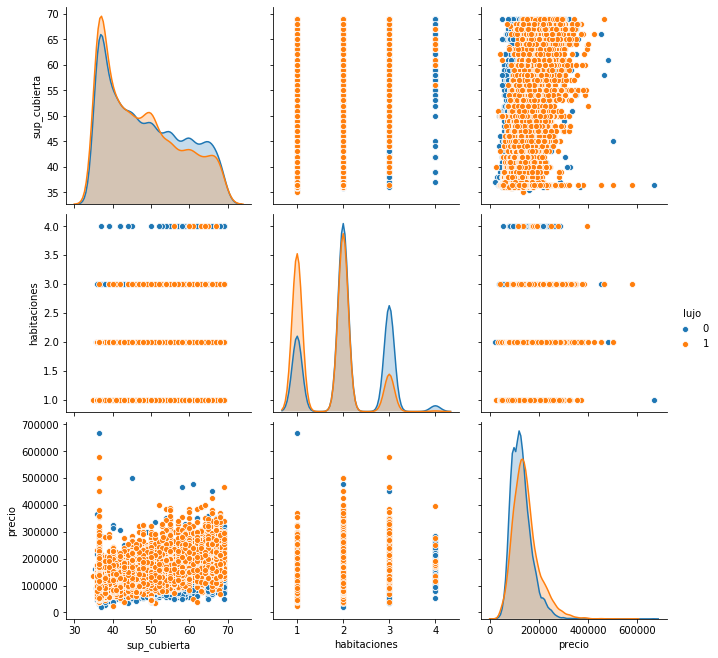

In [24]:
sns.pairplot(df_train, vars=['sup_cubierta','habitaciones','precio'], hue='lujo', height=3)

# Pipeline preprocesamiento

In [331]:
pipe = make_transformer_pipeline()
X_train_transformed = pipe.fit_transform(X_train)

# transformación logarítmica del target
y_train_transformed=np.log(y_train.values)

In [332]:
X_train_transformed, y_train_transformed

(array([[ 0.84540209,  0.95209473, -0.55153999, ...,  1.        ,
          0.        ,  0.        ],
        [ 0.49640854,  0.63657231, -0.55153999, ...,  1.        ,
          0.        ,  0.        ],
        [-1.45550193, -0.73194261,  3.56685506, ...,  0.        ,
          0.        ,  1.        ],
        ...,
        [ 1.13721597,  0.19559168, -0.55153999, ...,  1.        ,
          0.        ,  0.        ],
        [ 0.66476808,  0.33972116, -0.55153999, ...,  1.        ,
          0.        ,  0.        ],
        [ 0.53212571, -1.03902861, -0.55153999, ...,  0.        ,
          0.        ,  1.        ]]),
 array([12.25486281, 12.23320131, 11.61728548, ..., 12.70684793,
        12.18857546, 11.69524702]))

# Modelo red densa Keras

In [382]:
EPOCHS = 1000
BATCH_SIZE = 64

# Callbacks #

# Parar entrenamiento cuando no mejora MSE
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50)

# Guardar modelo entrenado
checkpoint = keras.callbacks.ModelCheckpoint('modelo_prediccion_propiedades.hdf5', monitor='loss', verbose=0,
    save_best_only=True, mode='auto')

# Reducir learning rate cuando no mejora MSE
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10, min_lr=0.0001)

# optimizer = tf.keras.optimizers.RMSprop(0.01)
# optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

model = build_1layer_keras_model(X_train_transformed.shape[1], n_neurons=64) 
# model = build_2layer_keras_model(X_train_transformed.shape[1], n_neurons_1=8, n_neurons_2=16) 
# model.compile(loss='mse', optimizer='adam', metrics=[tf.keras.metrics.RootMeanSquaredError()])

model.summary()

Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_82 (Dense)             (None, 64)                1152      
_________________________________________________________________
dense_83 (Dense)             (None, 1)                 65        
Total params: 1,217
Trainable params: 1,217
Non-trainable params: 0
_________________________________________________________________


In [383]:
history = model.fit(X_train_transformed, y_train_transformed, 
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS, 
                    validation_split = 0.12, 
                    callbacks=[checkpoint, 
                               early_stop, 
                               reduce_lr, 
                               tfdocs.modeling.EpochDots()],
                    verbose=1)

rror: 0.1943 - val_loss: 0.0420 - val_root_mean_squared_error: 0.2050 - lr: 1.0000e-04
Epoch 233/1000
247/247 [==============================] - 0s 1ms/step - loss: 0.0378 - root_mean_squared_error: 0.1943 - val_loss: 0.0420 - val_root_mean_squared_error: 0.2049 - lr: 1.0000e-04
Epoch 234/1000
247/247 [==============================] - 0s 1ms/step - loss: 0.0377 - root_mean_squared_error: 0.1942 - val_loss: 0.0423 - val_root_mean_squared_error: 0.2056 - lr: 1.0000e-04
Epoch 235/1000
247/247 [==============================] - 0s 2ms/step - loss: 0.0377 - root_mean_squared_error: 0.1943 - val_loss: 0.0421 - val_root_mean_squared_error: 0.2053 - lr: 1.0000e-04
Epoch 236/1000
247/247 [==============================] - 0s 1ms/step - loss: 0.0377 - root_mean_squared_error: 0.1941 - val_loss: 0.0420 - val_root_mean_squared_error: 0.2049 - lr: 1.0000e-04
Epoch 237/1000
247/247 [==============================] - 0s 1ms/step - loss: 0.0377 - root_mean_squared_error: 0.1943 - val_loss: 0.0419 - v

Text(0, 0.5, 'MSE [Precio^2]')

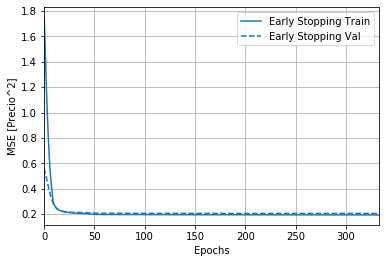

In [384]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)

plotter.plot({'Early Stopping': history}, metric = "root_mean_squared_error")
plt.ylabel('MSE [Precio^2]')

In [385]:
X_test_transformed = pipe.transform(X_test)
y_test_transformed = np.log(y_test.values)
loss, rmse = model.evaluate(X_test_transformed, y_test_transformed, verbose=2)

print("Testing set RMSE: {:5.2f}".format(math.exp(rmse)))

77/77 - 0s - loss: 0.0421 - root_mean_squared_error: 0.2051
Testing set RMSE:  1.23


In [386]:
y_pred = model.predict(X_test_transformed).flatten()
y_pred

array([11.373559, 11.894142, 11.765461, ..., 11.712323, 11.524889,
       11.682916], dtype=float32)

In [387]:
y_pred = np.exp(y_pred)
y_pred

array([ 86990.92, 146406.48, 128728.52, ..., 122066.74, 101203.53,
       118529.32], dtype=float32)

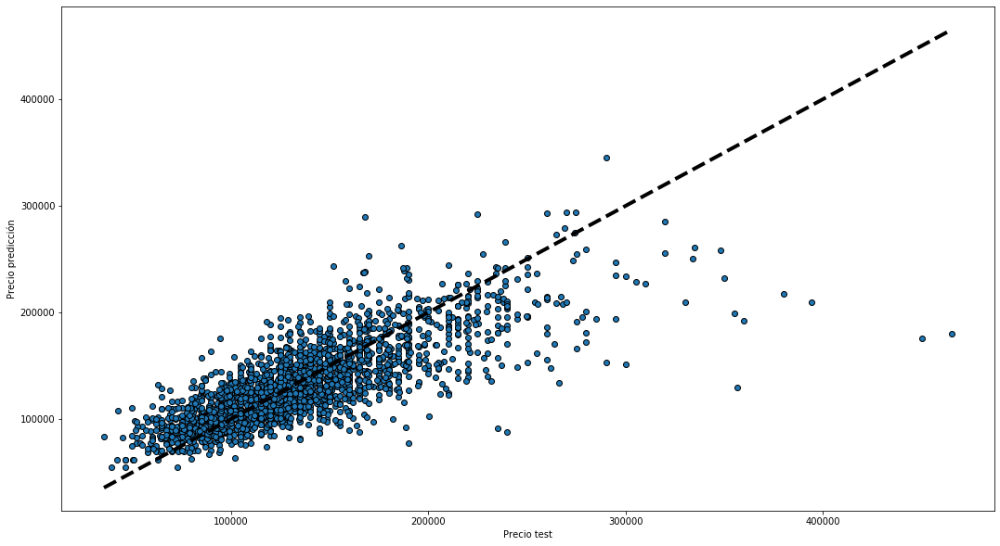

In [388]:
plot_test_predictions(y_test, y_pred)

# Preprocesamiento set de test

In [362]:
df_test = read_rds('data_test_def.rds')
df_test.head()

,id,lat,lon,precio,BARRIO,n_uni,n_boliches,n_clinicas,n_hospitales,n_comisarias,...,n_hurtos_auto,n_robo,n_robo_vehi,p_mt2,lujo,sup_total,habitaciones,descripcion,subbarrio,Cluster
0,2,-34.586330,-58.508957,NaN,villa pueyrredon,"[ 1, 3)","[ 1, 3)",0,0,1.0,...,"[0,15)","[-Inf, 214)","[1,6)",2842.666667,0,45.0,1.0,Impecable 2 ambientes con patio cubierto con t...,NaN,Media
1,34,-34.581699,-58.433547,NaN,palermo,"[ 3, 6)","[ 8, Inf]","[1,3)",0,0.0,...,"[15,30)","[ 214, 338)","[1,6)",3518.250000,0,53.0,1.0,Monoambiente impecable divisible a dos ambient...,Palermo Hollywood,Alta
2,54,-34.628187,-58.429586,NaN,parque chacabuco,"[-Inf, 1)","[ 1, 3)","[1,3)",1,1.0,...,"[15,30)","[ 214, 338)","[6,+)",2745.000000,1,42.0,2.0,Palmera Caballito: Torre con amenities de gran...,NaN,Baja
3,101,-34.593716,-58.440695,NaN,villa crespo,"[-Inf, 1)","[ 8, Inf]",0,0,1.0,...,"[30,+)","[ 338, 513)","[1,6)",2669.000000,0,62.0,2.0,Corredor Responsable: Ariel Champanier - CUCIC...,NaN,Media
4,103,-34.591336,-58.447218,NaN,chacarita,"[-Inf, 1)","[ 8, Inf]",0,0,1.0,...,"[15,30)","[ 214, 338)",0,2811.333333,1,44.0,2.0,Departamento de 2 ambientes con cochera ubicad...,NaN,Media


In [363]:
df_test.columns

Index(['id', 'lat', 'lon', 'precio', 'BARRIO', 'n_uni', 'n_boliches',
       'n_clinicas', 'n_hospitales', 'n_comisarias', 'n_embajadas',
       'n_subte_bocas', 'n_barrios_p', 'n_bici', 'n_bancos', 'n_gasolina',
       'n_gastronomica', 'n_homicidios', 'n_hurtos', 'n_hurtos_auto', 'n_robo',
       'n_robo_vehi', 'p_mt2', 'lujo', 'sup_total', 'habitaciones',
       'descripcion', 'subbarrio', 'Cluster'],
      dtype='object')

In [360]:
ids, df_test = preprocessing(df_test, process_outliers=False)

In [361]:
df_test.head()

,lat,lon,sup_total,habitaciones,cluster,balcon,cochera,parrilla,pileta,sum
id,,,,,,,,,,
2,-34.586330,-58.508957,45.0,1.0,Media,0,0,0,0,0
34,-34.581699,-58.433547,53.0,1.0,Alta,1,1,0,0,0
54,-34.628187,-58.429586,42.0,2.0,Baja,1,0,1,0,0
101,-34.593716,-58.440695,62.0,2.0,Media,1,0,0,0,0
103,-34.591336,-58.447218,44.0,2.0,Media,1,1,0,0,0


In [ ]:
df_test.drop(['precio'], axis=1, inplace=True)
df_test.head()

# Predicción con red neuronal

In [ ]:
X = pipe.transform(df_test)
X.shape

In [ ]:
y_pred = model.predict(X).flatten()
data = pd.DataFrame(data={'id' : ids.values, 'precio': np.round(y_pred).astype(int) })
data

In [ ]:
data.to_csv('propiedades_prediccion.csv', index=False)